In [3]:
#Load packages
from netCDF4 import Dataset
import numpy as np
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.ticker import (MultipleLocator, AutoMinorLocator)
import sys
import netCDF4 as nc4
from torch import nn
from torch import optim
import progressbar
import pytorch_lightning as pl
import torch.nn.functional as F
from torchvision import transforms
from torch import nn
from torch import optim
import progressbar
sys.path.append("/home2/datahome/tpicard/python/Python_Modules_p3_pyticles/")
#sys.path.append("/home2/datahome/tpicard/PhD_MOMOPAR/TRAIN_AND_VALIDATION_CNN/OLD/")
sys.path.append("../ANALYSE/")
sys.path.append("../TRAINING")
import torch
from torch.utils.data import DataLoader, Dataset
from CNN_tools import *
from CNN_UNET import *
from pytorch_lightning.callbacks import ModelCheckpoint
from DATALOADER import Pdf_Image_DataSet
from variables import *
from tools_analyse import *
import importlib

# LOADING DATA FROM INPUTS

In [25]:
image_test = load_images_simu2('cinquieme')

pdf_filter_test = load_pdf_filter_simu2()
pdf_filter_test = np.transpose(pdf_filter_test,(0,2,1,3,4))
pdf_filter_test = pdf_filter_test.reshape(pdf_filter_test.shape[0]*pdf_filter_test.shape[1],8,100,100)
pdf_filter_test = pdf_filter_test[::5]
#pdf_filter_test = pdf_filter_test[:-6]

Loading simu2 images ...
Done
Loading filtered pdf simu2 ...
Pdf filtered simu2 loaded


# LOAD PREDICTIONS DATA

In [26]:

folder = "../DATA/"

#LOAD super model
nc = nc4.Dataset(folder+'supermodel_4L_2.nc','r')
super_model_4L = np.asfortranarray(nc.variables['super_model_norm'][:,:,:])
nc.close()

#LOAD super model
nc = nc4.Dataset(folder+'supermodel_surf_2.nc','r')
super_model_surf = np.asfortranarray(nc.variables['super_model_norm'][:,:,:])
nc.close()


# COMPUTE THE SCORE

In [27]:
list_bhatta = np.zeros(pdf_filter_test.shape[0])
for i in range(pdf_filter_test.shape[0]):
    list_bhatta[i] = 1 - np.sum(np.sqrt(np.abs((np.multiply(super_model_4L[i,:,:], pdf_filter_test[i,-1,:,:])))))


In [28]:
list_bhatta_surf = np.zeros(pdf_filter_test.shape[0])
for i in range(pdf_filter_test.shape[0]):
    list_bhatta_surf[i] = 1 - np.sum(np.sqrt(np.abs((np.multiply(super_model_surf[i,:,:], pdf_filter_test[i,-1,:,:])))))


In [29]:
list_iou = np.zeros(pdf_filter_test.shape[0])
for i in range(pdf_filter_test.shape[0]):
    list_iou[i] = iou_numpy(super_model_4L[i,:,:], pdf_filter_test[i,-1,:,:])


In [30]:
list_iou_part = np.zeros(pdf_filter_test.shape[0])
for i in range(pdf_filter_test.shape[0]):
    list_iou_part[i] = iou_particles(super_model_4L[i,:,:], pdf_filter_test[i,-1,:,:])


In [31]:
list_rand = np.array([1225,  117,  774,  584, 1210,  545,  196, 1359,  715,  521,  804, 672, 1006,  148,  264,  498,  484,  339,  279, 19, 82, 494, 177,   74,  230,  593, 1352,  652,  371, 1091,  310,  730,  136, 116,   60,  829])

<ipython-input-32-622e71c43592>:28: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cb = plt.pcolormesh(lon, lat,image_test[index,-18,:,:].T,cmap = plt.cm.RdBu,vmax=0,vmin=-1)
<ipython-input-32-622e71c43592>:30: UserWarning: The following kwargs were not used by contour: 'label'
  CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
<ipython-input-32-622e71c43592>:31: UserWarning: The following kwargs were not used by contour: 'label'
  CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)


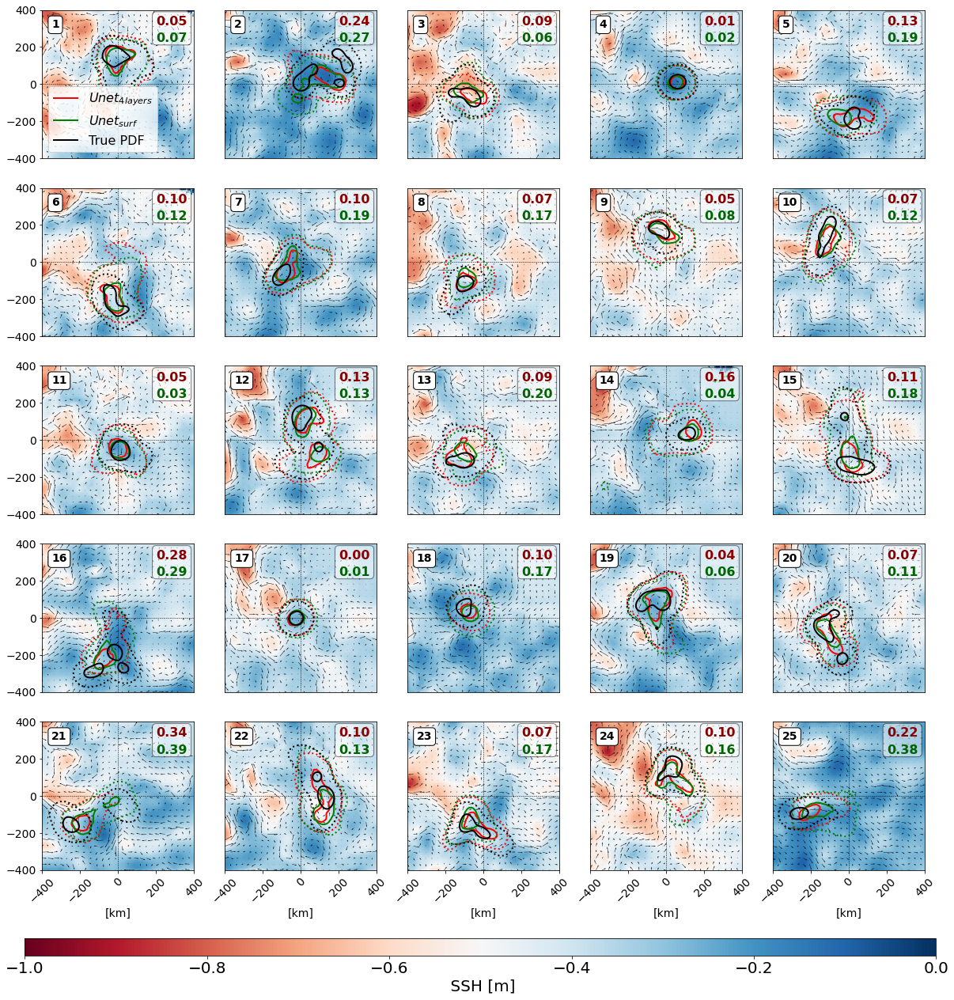

In [32]:
# SURFACE + 4L
filtre = 4
from numpy import random 

lon = np.linspace(-400,400,nb_dx)
lat = np.linspace(-400,400,nb_dx)
#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(20,20))
gap = 299


#list_rand=random.randint(0,super_model_4L.shape[0],36)
list_rand = np.array([1225,  774 ,  1210,  
                      1374, 1359,  715,  804, 
                      1006, 148,  264,  1216,  339,  
                      279, 19, 82, 818,   74, 
                      230, 1352,  652, 1091,  
                      310, 730, 116,   60,  829])
for i in range(25):
    ax = fig.add_subplot(5,5,i+1)
    index= list_rand[i]
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    cb = plt.pcolormesh(lon, lat,image_test[index,-18,:,:].T,cmap = plt.cm.RdBu,vmax=0,vmin=-1)
    plt.quiver(lon[::filtre],lat[::filtre],image_test[index,-26,::filtre,::filtre].T,image_test[index,-22,::filtre,::filtre].T)
    CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
    CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)
    CS2 = plt.contour(lon, lat,pdf_filter_test[index,-1,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'],linewidths=2)
    
    if i ==0:
        CS0.collections[1].set_label('$Unet_{4layers}$')
        CS1.collections[1].set_label('$Unet_{surf}$')
        CS2.collections[1].set_label('True PDF')
        plt.legend(prop={'size': 16},loc = 3)
    
    if i%5==0:
        plt.yticks([-400,-200,0,200,400],size=14)
    if i > 19:
        plt.xticks([-400,-200,0,200,400],size=14,rotation = 45)
        plt.xlabel('[km]',size=14)

    #plt.title('BL = {0:.2f} / {1:.2f}'.format(list_bhatta[index],list_bhatta_surf[index]))
    
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    props2 = dict(boxstyle='round', facecolor='white', alpha=0.5)
    props3 = dict(boxstyle='round', facecolor='white', alpha=0)
    
    textstr = str(i+1)
    plt.text(-350, 350, textstr, fontsize=14,
            verticalalignment='top', bbox=props, weight='bold')
    
    textstr = '{0:.2f}\n'.format(list_bhatta[index])
    plt.text(200, 370, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkred',bbox=props2, )
    
    textstr = '{0:.2f}'.format(list_bhatta_surf[index])
    plt.text(200, 280, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkgreen',bbox=props3, )
    
    #textstr = '{0:.2f} / {1:.2f}'.format(list_bhatta_surf[index])
    #plt.text(0, 280, textstr, fontsize=16,
    #    verticalalignment='top', weight='bold',color='darkgreen',bbox=props3, )
    
    
    plt.axvline(x=0,color='black',linestyle='--',linewidth=0.5)
    plt.axhline(y=0,color='black',linestyle='--',linewidth=0.5)

    
cbaxes = fig.add_axes([0.11, 0.05, 0.8, 0.015]) 
cb = plt.colorbar(cb,ax = ax, cax = cbaxes,orientation="horizontal")  
cb.set_label(r' SSH [m]', fontsize=20)
cb.ax.tick_params(labelsize=20)

#plt.savefig('Example_prediction_25_no_contour.png', dpi = 400)


# With EKE and KE

In [18]:
folder = '../DATA/'
name_nc = 'MKE_EKE_box1040km_windows30j_sample20.nc'
file = folder+name_nc
nc = nc4.Dataset(file,'r')
EKE = np.asfortranarray(nc.variables['EKE'][:,:])
MKE = np.asfortranarray(nc.variables['MKE'][:,:])
date_EKE = np.asfortranarray(nc.variables['time'][:])
nc.close()


In [16]:
level_600 = 12 
level_200 = 4

window = 60
def image_selector_1layer(pos,var):
    pos_j = pos%6
    pos_i = pos//6
    d_ic = ic_all_list[pos_i]
    d_jc = jc_all_list[pos_j]
    var = var[window+d_ic:-window+d_ic,window+d_jc:-window+d_jc]

    return(var)

#for i in range(190):
EKE_mean = np.nanmean(EKE[:,level_200:,:,:],axis=1)
MKE_mean = np.nanmean(MKE[:,level_200:,:,:],axis=1)

EKE_pos = []

for i in range(EKE.shape[0]):
    for pos in range(0,36):
        KE_i = EKE_mean[i,:,:]
        KE_box = image_selector_1layer(pos,KE_i)
        EKE_pos.append(KE_box)
EKE_pos = np.array(EKE_pos)

#for i in range(190):
MKE_pos = []

for i in range(EKE.shape[0]):
    for pos in range(0,36):
        KE_i = MKE_mean[i,:,:]
        KE_box = image_selector_1layer(pos,KE_i)
        MKE_pos.append(KE_box)
        
MKE_pos = np.array(MKE_pos)
MKE_pos_cinquieme = MKE_pos[::5,:,:]
EKE_pos_cinquieme = EKE_pos[::5,:,:]

TKE_mean = np.nanmean(MKE_pos[:,100:-100,100:-100],axis=(1,2)) + np.nanmean(EKE_pos[:,100:-100,100:-100],axis=(1,2))

<ipython-input-16-e82885d3deb2>:15: RuntimeWarning: Mean of empty slice
  EKE_mean = np.nanmean(EKE[:,level_200:,:,:],axis=1)
<ipython-input-16-e82885d3deb2>:16: RuntimeWarning: Mean of empty slice
  MKE_mean = np.nanmean(MKE[:,level_200:,:,:],axis=1)


<ipython-input-17-560b413a20ab>:33: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cb = plt.pcolormesh(lon_ke, lat_ke,MKE_pos_cinquieme[index,:,:].T*10000,cmap = plt.cm.Reds,vmin= 0,vmax=400)
No handles with labels found to put in legend.
<ipython-input-17-560b413a20ab>:55: UserWarning: The following kwargs were not used by contour: 'label'
  CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
<ipython-input-17-560b413a20ab>:56: UserWarning: The following kwargs were not used by contour: 'label'
  CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dot

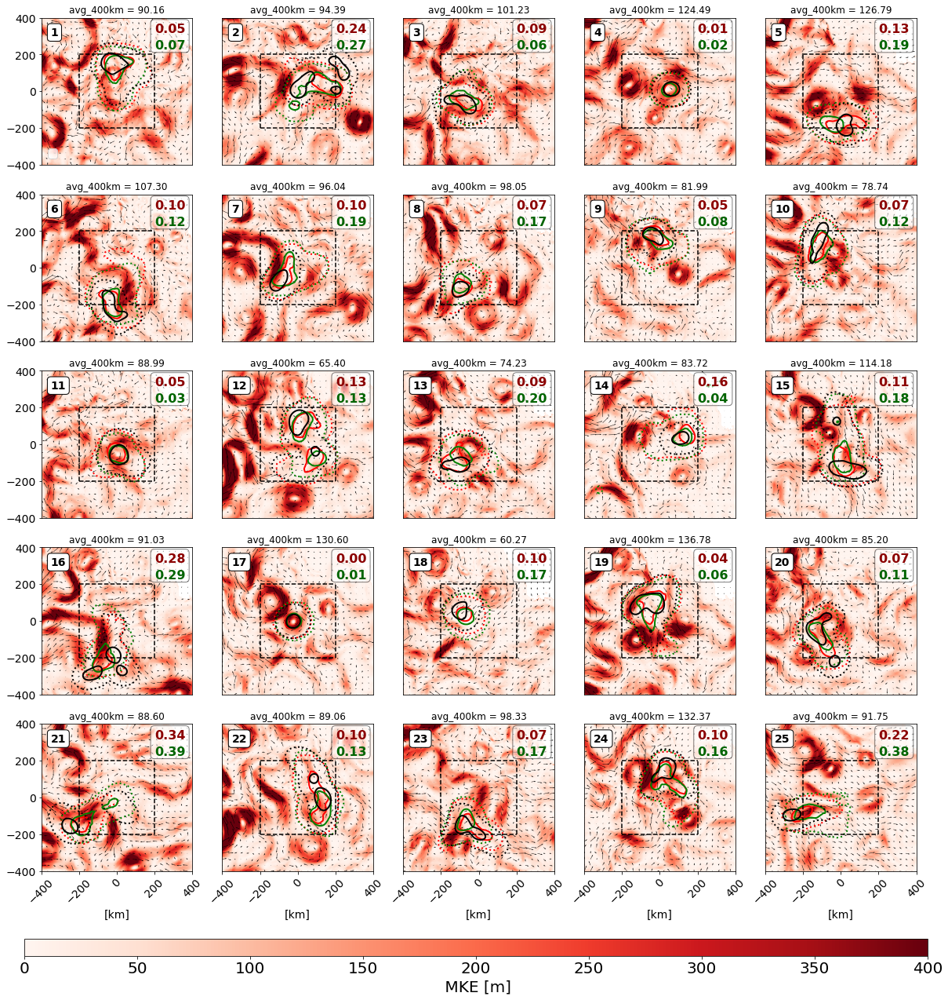

In [17]:
# SURFACE + 4L

from numpy import random 
filtre= 4
lon_ke = np.linspace(-400,400,400)
lat_ke = np.linspace(-400,400,400)

lon = np.linspace(-400,400,100)
lat = np.linspace(-400,400,100)

#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(20,20))
gap = 299

#list_rand=random.randint(0,super_model_4L.shape[0],36)

list_rand = np.array([1225,  774 ,  1210,  
                      1374, 1359,  715,  804, 
                      1006, 148,  264,  1216,  339,  
                      279, 19, 82, 818,   74, 
                      230, 1352,  652, 1091,  
                      310, 730, 116,   60,  829])

for i in range(25):
    ax = fig.add_subplot(5,5,i+1)
    index= list_rand[i]
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    cb = plt.pcolormesh(lon_ke, lat_ke,MKE_pos_cinquieme[index,:,:].T*10000,cmap = plt.cm.Reds,vmin= 0,vmax=400)
    u_i = image_test[index,-26,:,:].T
    v_i = image_test[index,-22,:,:].T
    plt.quiver(lon[::filtre],lat[::filtre],u_i[::filtre,::filtre],v_i[::filtre,::filtre])
    
    if i ==0:
        CS0.collections[1].set_label('$Unet_{4layers}$')
        CS1.collections[1].set_label('$Unet_{surf}$')
        CS2.collections[1].set_label('True PDF')
        plt.legend(prop={'size': 16},loc = 3)
    
    if i%5==0:
        plt.yticks([-400,-200,0,200,400],size=14)
    if i > 19:
        plt.xticks([-400,-200,0,200,400],size=14,rotation = 45)
        plt.xlabel('[km]',size=14)

        
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    
    CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
    CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)
    CS2 = plt.contour(lon, lat,pdf_filter_test[index,-1,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'],linewidths=2)
    
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    props2 = dict(boxstyle='round', facecolor='white', alpha=0.5)
    props3 = dict(boxstyle='round', facecolor='white', alpha=0)
    
    textstr = str(i+1)
    plt.text(-350, 350, textstr, fontsize=14,
            verticalalignment='top', bbox=props, weight='bold')
    
    textstr = '{0:.2f}\n'.format(list_bhatta[index])
    plt.text(200, 370, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkred',bbox=props2, )
    
    textstr = '{0:.2f}'.format(list_bhatta_surf[index])
    plt.text(200, 280, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkgreen',bbox=props3, )
    
    plt.title("avg_400km = {0:.2f}".format(np.nanmean(MKE_pos_cinquieme[index,100:-100,100:-100]*10000)))
   
    plt.hlines(-200,-200,200,linestyle='--',color='k')
    plt.hlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(-200,-200,200,linestyle='--',color='k')

cbaxes = fig.add_axes([0.11, 0.05, 0.8, 0.015]) 
cb = plt.colorbar(cb,ax = ax, cax = cbaxes,orientation="horizontal")  
cb.set_label(r' MKE [m]', fontsize=20)
cb.ax.tick_params(labelsize=20)

#plt.savefig('Example_prediction_25_MKE.png', dpi = 400)

<ipython-input-71-2ba4e02869bf>:33: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cb = plt.pcolormesh(lon_ke, lat_ke,EKE_pos_cinquieme[index,:,:].T*10000,cmap = plt.cm.Reds,vmin=0,vmax=300)
<ipython-input-71-2ba4e02869bf>:42: UserWarning: The following kwargs were not used by contour: 'label'
  CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
<ipython-input-71-2ba4e02869bf>:43: UserWarning: The following kwargs were not used by contour: 'label'
  CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)


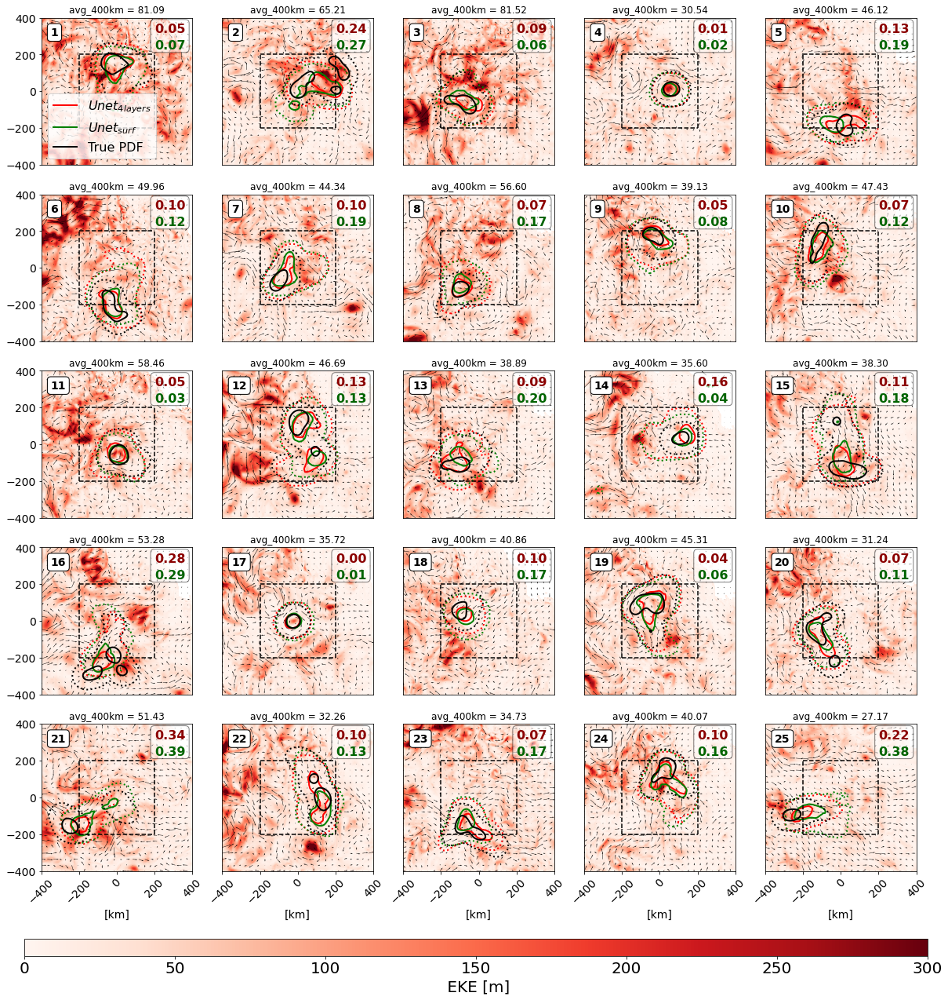

In [71]:
# SURFACE + 4L

from numpy import random 
filtre= 4
lon_ke = np.linspace(-400,400,400)
lat_ke = np.linspace(-400,400,400)

lon = np.linspace(-400,400,100)
lat = np.linspace(-400,400,100)

#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(20,20))
gap = 299

for i in range(25):
    ax = fig.add_subplot(5,5,i+1)
    index= list_rand[i]
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    cb = plt.pcolormesh(lon_ke, lat_ke,EKE_pos_cinquieme[index,:,:].T*10000,cmap = plt.cm.Reds,vmin=0,vmax=300)
    u_i = image_test[index,-26,:,:].T
    v_i = image_test[index,-22,:,:].T
    plt.quiver(lon[::filtre],lat[::filtre],u_i[::filtre,::filtre],v_i[::filtre,::filtre])
    
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    
    CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
    CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)
    CS2 = plt.contour(lon, lat,pdf_filter_test[index,-1,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'],linewidths=2)
    
    if i ==0:
        CS0.collections[1].set_label('$Unet_{4layers}$')
        CS1.collections[1].set_label('$Unet_{surf}$')
        CS2.collections[1].set_label('True PDF')
        plt.legend(prop={'size': 16},loc = 3)
    
    if i%5==0:
        plt.yticks([-400,-200,0,200,400],size=14)
    if i > 19:
        plt.xticks([-400,-200,0,200,400],size=14,rotation = 45)
        plt.xlabel('[km]',size=14)
        
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    props2 = dict(boxstyle='round', facecolor='white', alpha=0.5)
    props3 = dict(boxstyle='round', facecolor='white', alpha=0)
    
    textstr = str(i+1)
    plt.text(-350, 350, textstr, fontsize=14,
            verticalalignment='top', bbox=props, weight='bold')
    
    textstr = '{0:.2f}\n'.format(list_bhatta[index])
    plt.text(200, 370, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkred',bbox=props2, )
    
    textstr = '{0:.2f}'.format(list_bhatta_surf[index])
    plt.text(200, 280, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkgreen',bbox=props3, )
    
    plt.title("avg_400km = {0:.2f}".format(np.nanmean(EKE_pos_cinquieme[index,100:-100,100:-100]*10000)))
   
   
    plt.hlines(-200,-200,200,linestyle='--',color='k')
    plt.hlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(-200,-200,200,linestyle='--',color='k')
    
cbaxes = fig.add_axes([0.11, 0.05, 0.8, 0.015]) 
cb = plt.colorbar(cb,ax = ax, cax = cbaxes,orientation="horizontal")  
cb.set_label(r' EKE [m]', fontsize=20)
cb.ax.tick_params(labelsize=20)

#plt.savefig('Example_prediction_25_EKE.png', dpi = 400)

<ipython-input-84-3b5ca3b843c3>:34: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cb = plt.pcolormesh(lon_ke, lat_ke,(MKE_pos_cinquieme[index,:,:].T+EKE_pos_cinquieme[index,:,:])*10000,cmap = plt.cm.Reds,vmin= 0,vmax=500)
No handles with labels found to put in legend.
<ipython-input-84-3b5ca3b843c3>:56: UserWarning: The following kwargs were not used by contour: 'label'
  CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
<ipython-input-84-3b5ca3b843c3>:57: UserWarning: The following kwargs were not used by contour: 'label'
  CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['g

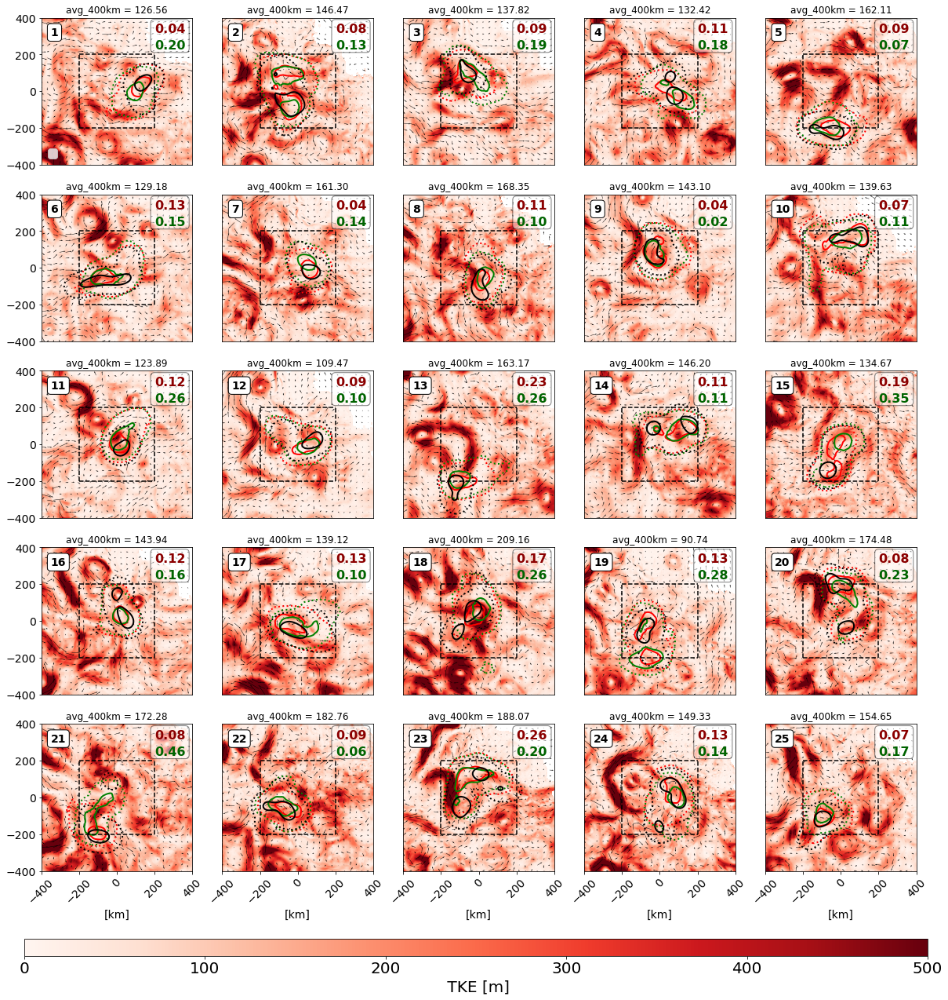

In [84]:
# SURFACE + 4L

from numpy import random 
filtre= 4
lon_ke = np.linspace(-400,400,400)
lat_ke = np.linspace(-400,400,400)

lon = np.linspace(-400,400,100)
lat = np.linspace(-400,400,100)

#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(20,20))
gap = 299

list_rand=random.randint(0,super_model_4L.shape[0],36)

for i in range(25):
    ax = fig.add_subplot(5,5,i+1)
    index= list_rand[i]
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    cb = plt.pcolormesh(lon_ke, lat_ke,(MKE_pos_cinquieme[index,:,:].T+EKE_pos_cinquieme[index,:,:])*10000,cmap = plt.cm.Reds,vmin= 0,vmax=500)
    u_i = image_test[index,-26,:,:].T
    v_i = image_test[index,-22,:,:].T
    plt.quiver(lon[::filtre],lat[::filtre],u_i[::filtre,::filtre],v_i[::filtre,::filtre])
    
    if i ==0:
        CS0.collections[1].set_label('$Unet_{4layers}$')
        CS1.collections[1].set_label('$Unet_{surf}$')
        CS2.collections[1].set_label('True PDF')
        plt.legend(prop={'size': 16},loc = 3)
    
    if i%5==0:
        plt.yticks([-400,-200,0,200,400],size=14)
    if i > 19:
        plt.xticks([-400,-200,0,200,400],size=14,rotation = 45)
        plt.xlabel('[km]',size=14)

        
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    
    CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
    CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)
    CS2 = plt.contour(lon, lat,pdf_filter_test[index,-1,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'],linewidths=2)
    
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    props2 = dict(boxstyle='round', facecolor='white', alpha=0.5)
    props3 = dict(boxstyle='round', facecolor='white', alpha=0)
    
    textstr = str(i+1)
    plt.text(-350, 350, textstr, fontsize=14,
            verticalalignment='top', bbox=props, weight='bold')
    
    textstr = '{0:.2f}\n'.format(list_bhatta[index])
    plt.text(200, 370, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkred',bbox=props2, )
    
    textstr = '{0:.2f}'.format(list_bhatta_surf[index])
    plt.text(200, 280, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkgreen',bbox=props3, )
    
    plt.title("avg_400km = {0:.2f}".format(np.nanmean((MKE_pos_cinquieme[index,100:-100,100:-100]+EKE_pos_cinquieme[index,100:-100,100:-100])*10000)))
   
    plt.hlines(-200,-200,200,linestyle='--',color='k')
    plt.hlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(-200,-200,200,linestyle='--',color='k')
    
    
cbaxes = fig.add_axes([0.11, 0.05, 0.8, 0.015]) 
cb = plt.colorbar(cb,ax = ax, cax = cbaxes,orientation="horizontal")  
cb.set_label(r' TKE [m]', fontsize=20)
cb.ax.tick_params(labelsize=20)

#plt.savefig('Example_prediction_25_TKE.png', dpi = 400)

# 3 EXEMPLES

In [29]:
list_rand = np.array([1225,  774 ,  1210,  
                      1374, 1359,  715,  804, 
                      1006, 148,  264,  1216,  339,  
                      279, 19, 82, 818,   74, 
                      230, 1352,  652, 1091,  
                      310, 730, 116,   60,  829])
list_rand[16]

74

<ipython-input-57-1dac67d874b6>:31: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cb = plt.pcolormesh(lon_ke, lat_ke,(MKE_pos_cinquieme[index,:,:].T+EKE_pos_cinquieme[index,:,:])*10000,cmap = plt.cm.Reds,vmin= 0,vmax=500)
<ipython-input-57-1dac67d874b6>:48: UserWarning: The following kwargs were not used by contour: 'label'
  CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)


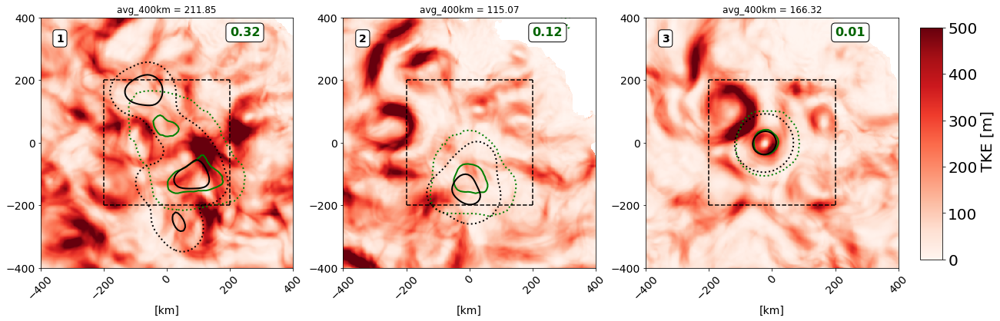

In [57]:
# SURFACE + 4L

from numpy import random 
filtre= 4
lon_ke = np.linspace(-400,400,400)
lat_ke = np.linspace(-400,400,400)

lon = np.linspace(-400,400,100)
lat = np.linspace(-400,400,100)

#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(20,6))
gap = 299

list_rand=random.randint(0,super_model_4L.shape[0],36)


list_rand = np.array([1318,  1099 ,  74])

t=1
for i in range(3):
    ax = fig.add_subplot(1,3,t)
    t=t+1
    index= list_rand[i]
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    cb = plt.pcolormesh(lon_ke, lat_ke,(MKE_pos_cinquieme[index,:,:].T+EKE_pos_cinquieme[index,:,:])*10000,cmap = plt.cm.Reds,vmin= 0,vmax=500)
    u_i = image_test[index,-26,:,:].T
    v_i = image_test[index,-22,:,:].T
    #plt.quiver(lon[::filtre],lat[::filtre],u_i[::filtre,::filtre],v_i[::filtre,::filtre])
    
    plt.yticks([-400,-200,0,200,400],size=14)
    plt.xticks([-400,-200,0,200,400],size=14,rotation = 45)
    plt.xlabel('[km]',size=14)

        
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    
    #CS0= plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'],label ='$Unet_{4layers}$',linewidths=2)
    CS1= plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'],label ='$Unet_{surf}$',linewidths=2)
    CS2 = plt.contour(lon, lat,pdf_filter_test[index,-1,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'],linewidths=2)
    
    if i ==0:
        CS0.collections[1].set_label('$Unet_{4layers}$')
        CS1.collections[1].set_label('$Unet_{surf}$')
        CS2.collections[1].set_label('True PDF')
        #plt.legend(prop={'size': 16},loc = 3)
        
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    props2 = dict(boxstyle='round', facecolor='white', alpha=0.5)
    props3 = dict(boxstyle='round', facecolor='white', alpha=0)
    
    textstr = str(i+1)
    plt.text(-350, 350, textstr, fontsize=14,
            verticalalignment='top', bbox=props, weight='bold')

    textstr = '{0:.2f}'.format(list_bhatta_surf[index])
    plt.text(200, 370, textstr, fontsize=16,
        verticalalignment='top', weight='bold',color='darkgreen',bbox=props, )
    
    plt.title("avg_400km = {0:.2f}".format(np.nanmean((MKE_pos_cinquieme[index,100:-100,100:-100]+EKE_pos_cinquieme[index,100:-100,100:-100])*10000)))
   
    plt.hlines(-200,-200,200,linestyle='--',color='k')
    plt.hlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(200,-200,200,linestyle='--',color='k')
    plt.vlines(-200,-200,200,linestyle='--',color='k')

cbaxes = fig.add_axes([0.92, 0.15, 0.02, 0.7]) 
cb = plt.colorbar(cb,ax = ax, cax = cbaxes,orientation="vertical")  
cb.set_label(r' TKE [m]', fontsize=20)
cb.ax.tick_params(labelsize=20)
plt.savefig('Example_3_prediction_TKE.png', dpi = 400)

# Exemples with entropy

<ipython-input-12-baffb6360738>:27: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  plt.pcolormesh(lon, lat,image_test[index,-1,:,:].T,cmap = plt.cm.RdBu)
<ipython-input-12-baffb6360738>:32: RuntimeWarning: divide by zero encountered in log
  entropy = np.nansum(-pdf_filter_test[index,-1,:,:]*np.log(pdf_filter_test[index,-1,:,:]))
<ipython-input-12-baffb6360738>:32: RuntimeWarning: invalid value encountered in multiply
  entropy = np.nansum(-pdf_filter_test[index,-1,:,:]*np.log(pdf_filter_test[index,-1,:,:]))


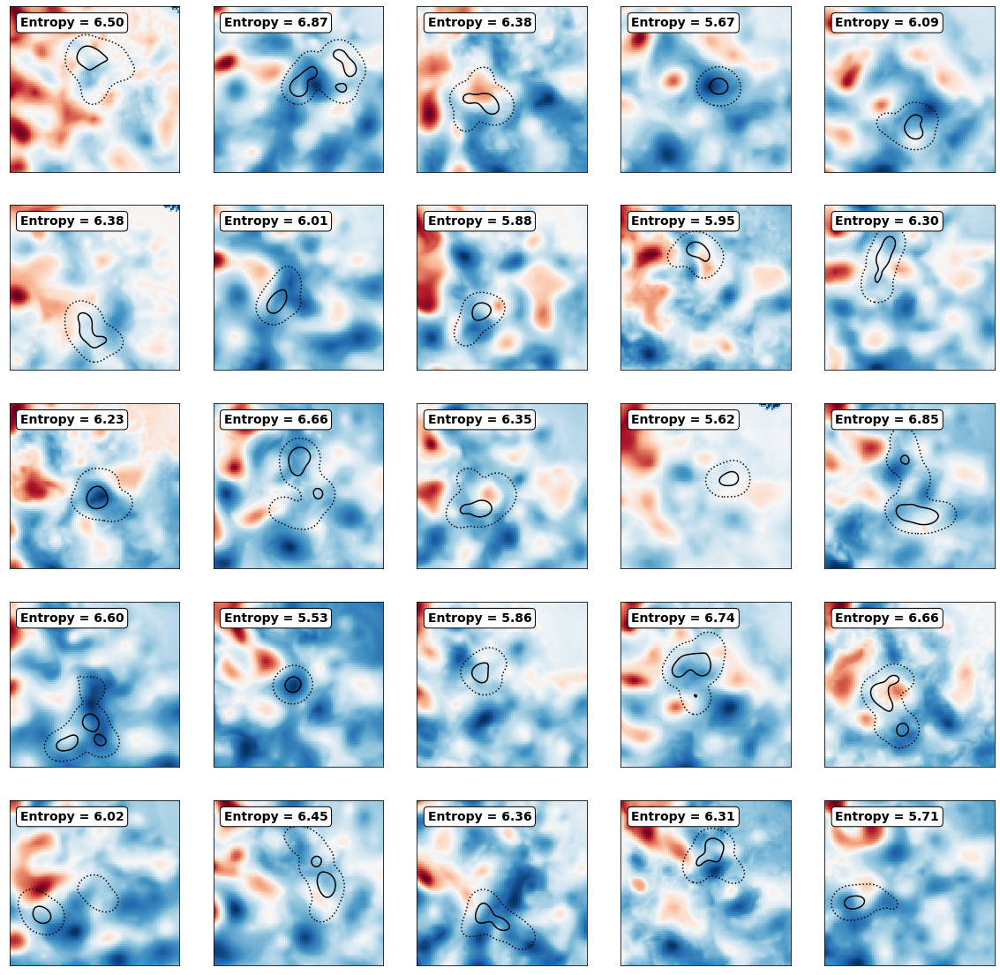

In [12]:
# SURFACE + 4L

from numpy import random 

lon = np.linspace(-400,400,nb_dx)
lat = np.linspace(-400,400,nb_dx)
#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(20,20))
gap = 299

#list_rand=random.randint(0,super_model_4L.shape[0],36)
list_rand = np.array([1225,  774 ,  1210,  
                      1374, 1359,  715,  804, 
                      1006, 148,  264,  1216,  339,  
                      279, 19, 82, 818,   74, 
                      230, 1352,  652, 1091,  
                      310, 730, 116,   60,  829])
for i in range(25):
    ax = fig.add_subplot(5,5,i+1)
    index= list_rand[i]
    levels_pred,fmt = add_contour_per(super_model_4L[index,:,:],[99,50])
    levels_pred_surf,fmt = add_contour_per(super_model_surf[index,:,:],[99,50])
    levels_true,fmt = add_contour_per(pdf_filter_test[index,-1,:,:],[99,50])
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    plt.pcolormesh(lon, lat,image_test[index,-1,:,:].T,cmap = plt.cm.RdBu)
    #plt.contour(lon, lat,super_model_4L[index,:,:].T,levels=levels_pred,colors=['red','red'],linestyles=['dotted','-'])
    #plt.contour(lon, lat,super_model_surf[index,:,:].T,levels=levels_pred_surf,colors=['green','green'],linestyles=['dotted','-'])
    CS = plt.contour(lon, lat,pdf_filter_test[index,-1,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'])
    
    entropy = np.nansum(-pdf_filter_test[index,-1,:,:]*np.log(pdf_filter_test[index,-1,:,:]))
    #plt.title('BL = {0:.2f} / {1:.2f}'.format(list_bhatta[index],list_bhatta_surf[index]))
    
    props = dict(boxstyle='round', facecolor='white', alpha=1)
    props2 = dict(boxstyle='round', facecolor='white', alpha=0)
    
    textstr = 'Entropy = {0:.2f}'.format(entropy)
    plt.text(-350, 350, textstr, fontsize=14,
            verticalalignment='top', bbox=props, weight='bold')
    
    #plt.savefig('entropy_exemples.png')
    

# 8 Layers Outputs

<ipython-input-6-8ad1f6e27707>:28: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  CS = plt.pcolormesh(lon, lat,pdf_filter_test[gap,i,:,:].T,cmap = plt.cm.Reds,vmax=0.01,vmin=0)


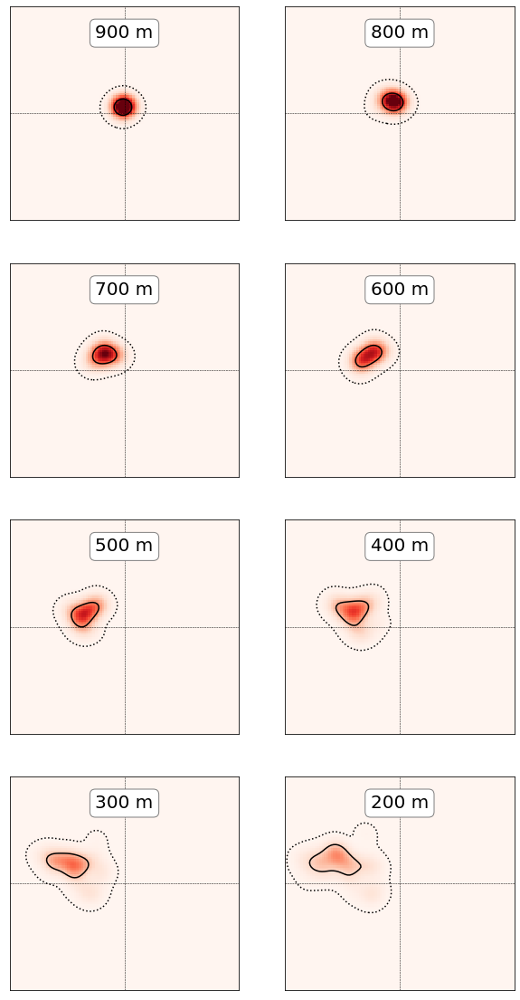

In [6]:

lon = np.linspace(-400,400,nb_dx)
lat = np.linspace(-400,400,nb_dx)
#levels = [0.0002,0.0025]
#levels = np.linspace(0.0001,0.01,5)
fig = plt.figure(figsize=(10,20))
gap = 452
list_level = [900,800,700,600,500,400,300,200]

bbox_props = dict(boxstyle="round", fc="w", ec="0.5", alpha=1)
for i in range(8):
    
    ax = fig.add_subplot(4,2,i+1)
    levels_true,fmt = add_contour_per(pdf_filter_test[gap,i,:,:],[99,50])
    plt.axvline(x=0,color='black',linestyle='--',linewidth=0.5)
    plt.axhline(y=0,color='black',linestyle='--',linewidth=0.5)
    plt.yticks([],size=14)
    plt.xticks([],size=14)
    ax.text(0, 300, str(list_level[i])+' m', ha="center", va="center", size=20,
        bbox=bbox_props)
    '''
    if i == 0 or i == 4:
        plt.yticks([-400,-200,0,200,400],size=14)
        
    if i < 4:
        plt.xticks([],size=14)
    '''
    
    CS = plt.pcolormesh(lon, lat,pdf_filter_test[gap,i,:,:].T,cmap = plt.cm.Reds,vmax=0.01,vmin=0)
    CS = plt.contour(lon, lat,pdf_filter_test[gap,i,:,:].T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'])
    #plt.title(i)
    #plt.savefig('pdf_outputs_8levels_2.png')

# BASELINE

In [32]:
baseline = np.mean(pdf_filter_test[:,-1,:,:],axis=0)

<ipython-input-52-c87d79b44b4f>:6: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  cb = plt.pcolormesh(lon, lat,baseline,cmap = plt.cm.Reds)


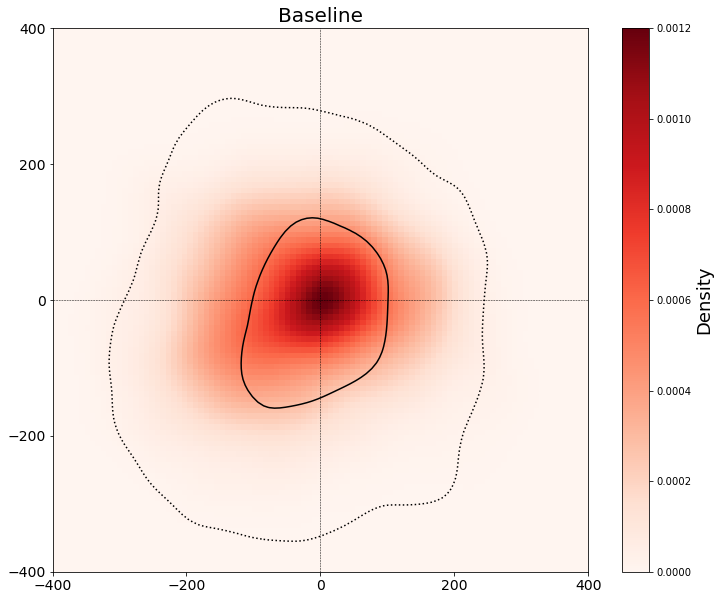

In [52]:
fig = plt.figure(figsize=(12,10))
plt.title('Baseline',size=20)
plt.axvline(x=0,color='black',linestyle='--',linewidth=0.5)
plt.axhline(y=0,color='black',linestyle='--',linewidth=0.5)
levels_true,fmt = add_contour_per(baseline,[99,50])
cb = plt.pcolormesh(lon, lat,baseline,cmap = plt.cm.Reds)
cp = plt.colorbar(cb)
cp.set_label('Density',fontsize=18)
CS = plt.contour(lon, lat,baseline.T,levels=levels_true,colors=['k','k'],linestyles=['dotted','-'])
plt.yticks([-400,-200,0,200,400],size=14)
plt.xticks([-400,-200,0,200,400],size=14)

plt.savefig('Baseline_pdf.png')